In [1]:
!nvidia-smi

Sat Mar  8 01:26:25 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   55C    P8             13W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install ultralytics
!pip install roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 54.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 85.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 27.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 59.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 96.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [4]:
import ultralytics
import os
from roboflow import Roboflow
from ultralytics import YOLO
from IPython.display import display,Image
from IPython import display
display.clear_output()
!yolo mode=checks

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 919, in entrypoint
    raise ValueError(f"Invalid 'mode={mode}'. Valid modes are {MODES}.\n{CLI_HELP_MSG}")
ValueError: Invalid 'mode=<module 'ultralytics.utils.checks' from '/usr/local/lib/python3.11/dist-packages/ultralytics/utils/checks.py'>'. Valid modes are frozenset({'export', 'train', 'track', 'predict', 'val', 'benchmark'}).

    Arguments received: ['yolo', 'mode=checks']. Ultralytics 'yolo' commands use the following syntax:

        yolo TASK MODE ARGS

        Where   TASK (optional) is one of frozenset({'obb', 'pose', 'detect', 'segment', 'classify'})
                MODE (required) is one of frozenset({'export', 'train', 'track', 'predict', 'val', 'benchmark'})
                ARGS (optional) are any number of custom 'arg=value' pairs like 'imgsz=320' tha

In [5]:
rf = Roboflow(api_key="Od5lGwnzWsFrsm9O2qoE")
project = rf.workspace("unistem").project("mun-voting-system")
dataset = project.version(4).download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to MUN-Voting-System-4 in yolov8:: 100%|██████████| 450/450 [00:00<00:00, 1376.10it/s]


In [6]:
!yolo task=detect mode=train  model=yolov8m.pt data={dataset.location}/data.yaml epochs=50 imgsz=640

100% 49.7M/49.7M [00:01<00:00, 48.3MB/s]
Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/content/MUN-Voting-System-4/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_cro

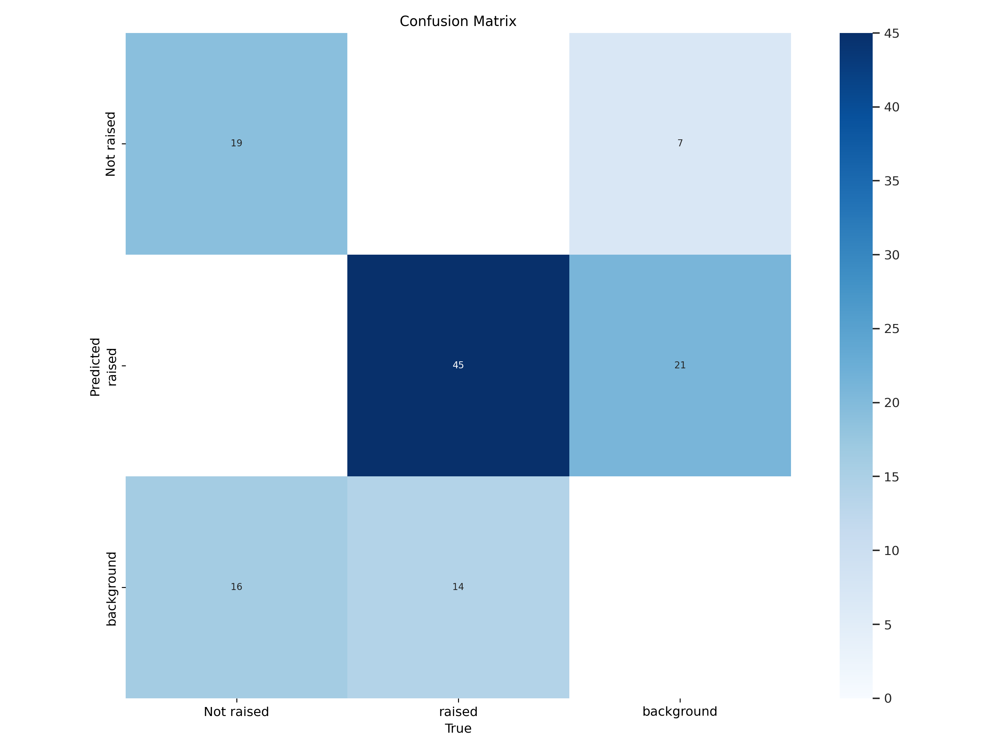

In [8]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=1200)

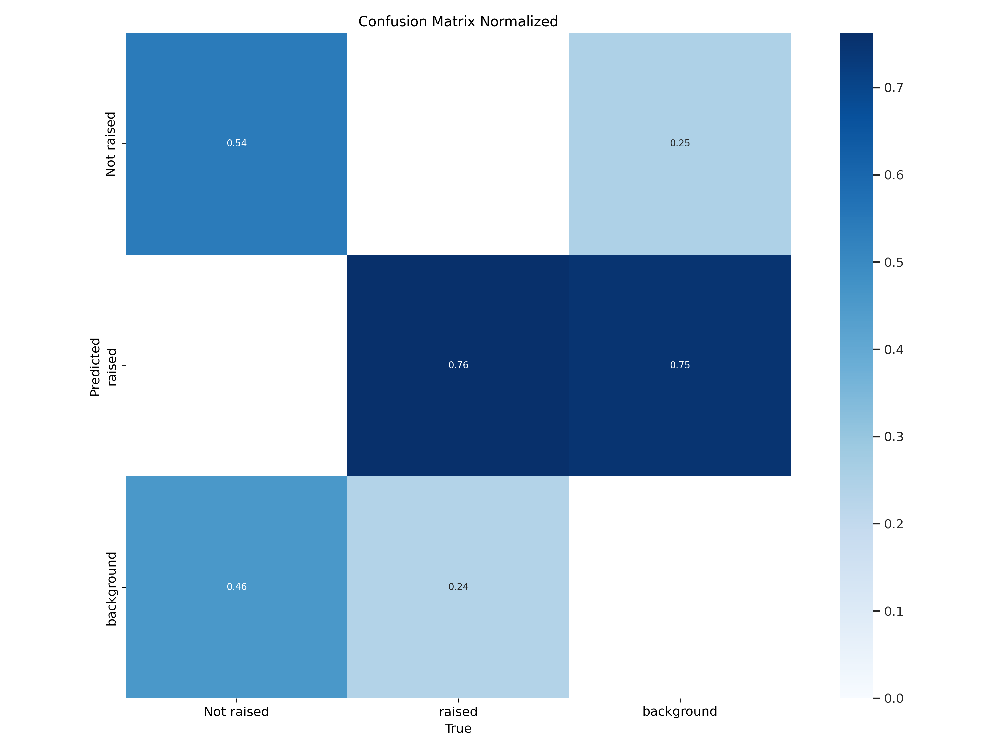

In [9]:
Image(filename=f'/content/runs/detect/train/confusion_matrix_normalized.png', width=1200)

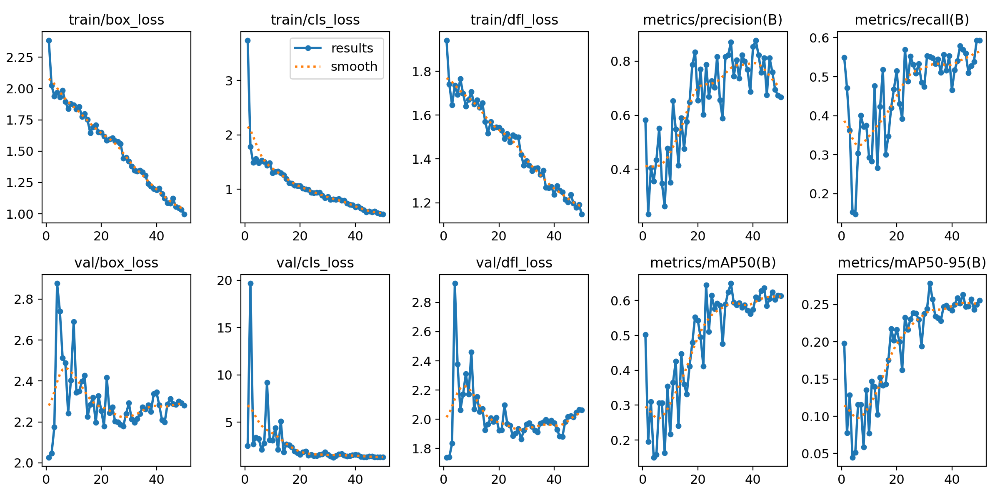

In [10]:
Image(filename=f'/content/runs/detect/train/results.png', width=1200)

In [12]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs
val: Scanning /content/MUN-Voting-System-4/valid/labels.cache... 18 images, 0 backgrounds, 0 corrupt: 100% 18/18 [00:00<?, ?it/s]
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 13, len(boxes) = 94. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:01<00:00,  1.92it/s]
                   all         18         94      0.715      0.638      0.645      0.276
            Not raised          9         35      0.743      0.514      0.576      0.241
                raised         12         59      0.686      0.763      0.714      0.311
Speed: 0.4ms preprocess, 32.0ms inference, 0.

In [13]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source={dataset.location}/test/images

Ultralytics 8.3.85 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 92 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs

image 1/9 /content/MUN-Voting-System-4/test/images/2023-03-02-UNISMUN-392_JPG.rf.8cc29300f542a5e8e554e5d7754ff24e.jpg: 448x640 1 raised, 58.2ms
image 2/9 /content/MUN-Voting-System-4/test/images/2023-03-03-UNISMUN-080_JPG.rf.3f03c299d4cb5f6e01c761beb4fd8081.jpg: 448x640 1 Not raised, 3 raiseds, 27.3ms
image 3/9 /content/MUN-Voting-System-4/test/images/2023-03-03-UNISMUN-099_JPG.rf.07c2cc0b82cba60e7662d2f6455165cd.jpg: 448x640 2 Not raiseds, 27.3ms
image 4/9 /content/MUN-Voting-System-4/test/images/2023-03-03-UNISMUN-109_JPG.rf.d197e24114ec0a580e325dd2eb79b81b.jpg: 448x640 3 Not raiseds, 27.3ms
image 5/9 /content/MUN-Voting-System-4/test/images/2023-03-03-UNISMUN-401_JPG.rf.9fa2a421eb259f2bebb4b1650df2ef7f.jpg: 384x640 5 Not raiseds, 41.7ms
image 6/9 /content/MUN-Voting-System-4/test/images/2023-03-04-UNISMUN-228_JPG.rf.ae3e

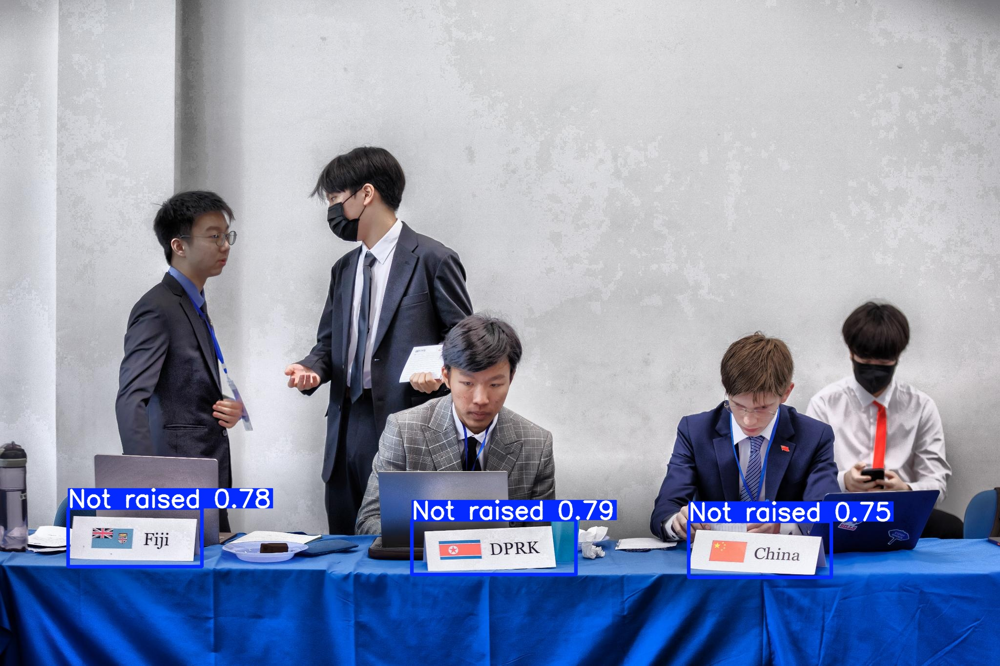

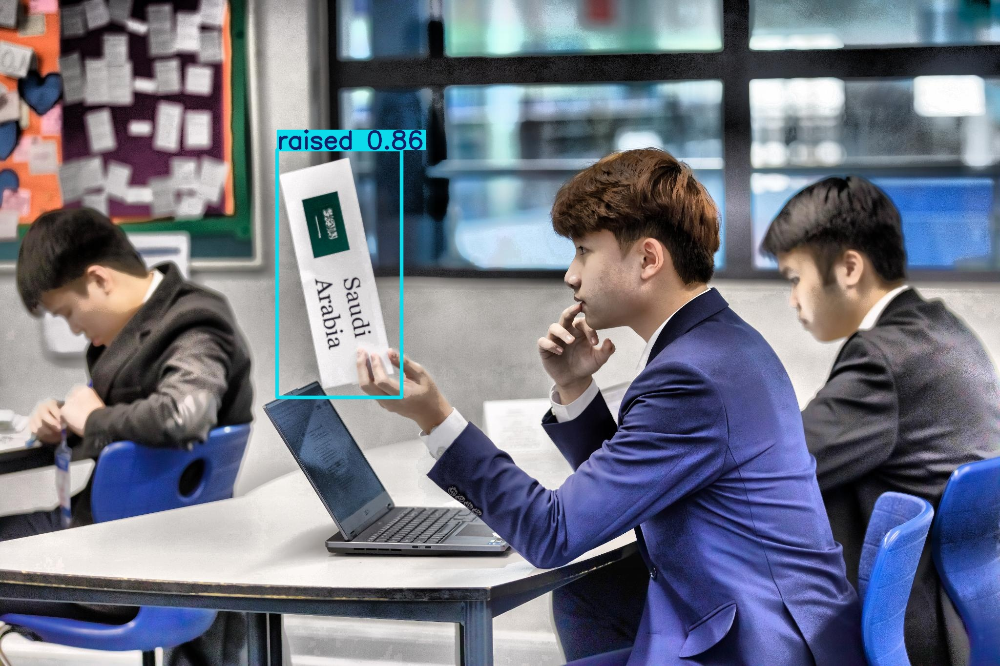

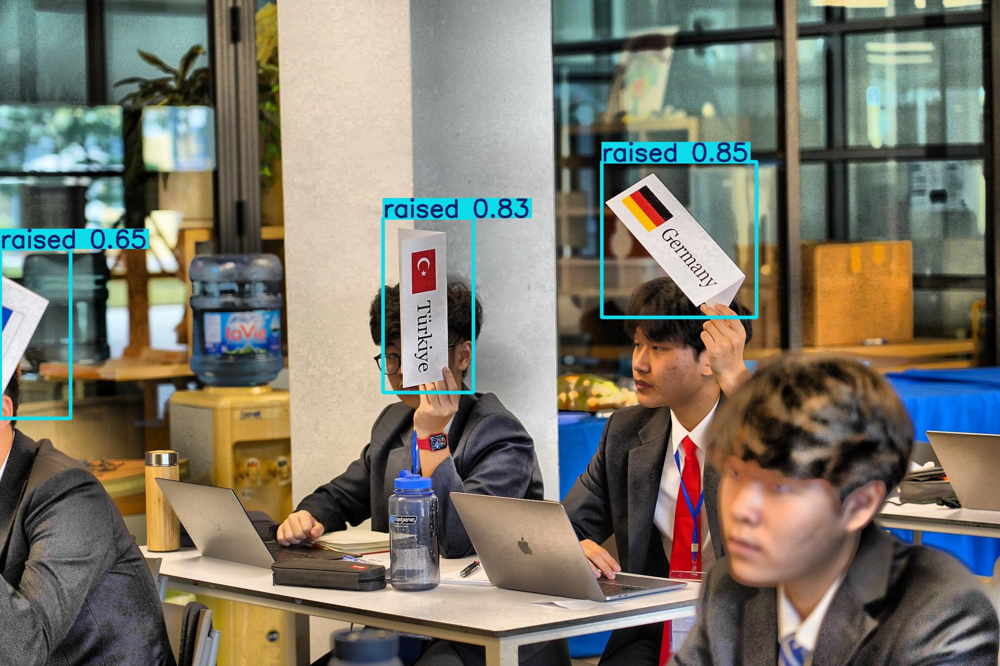

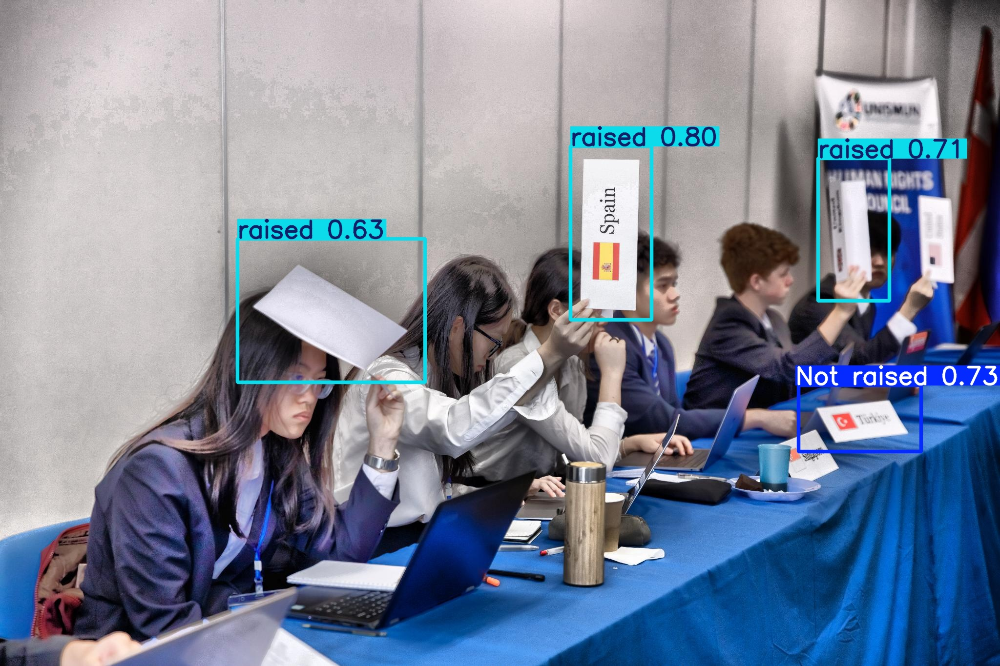

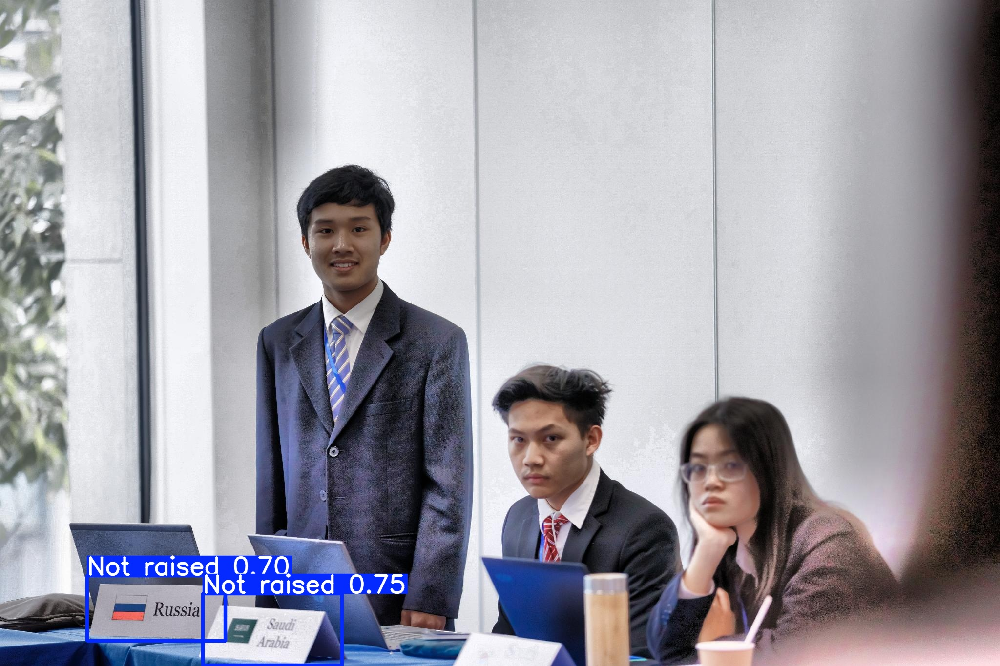

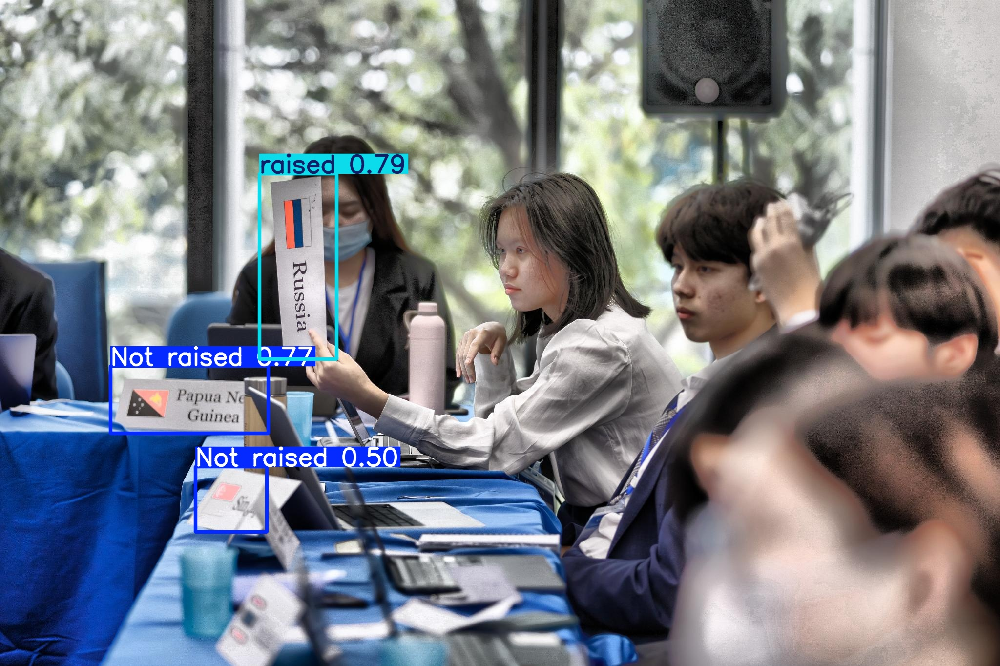

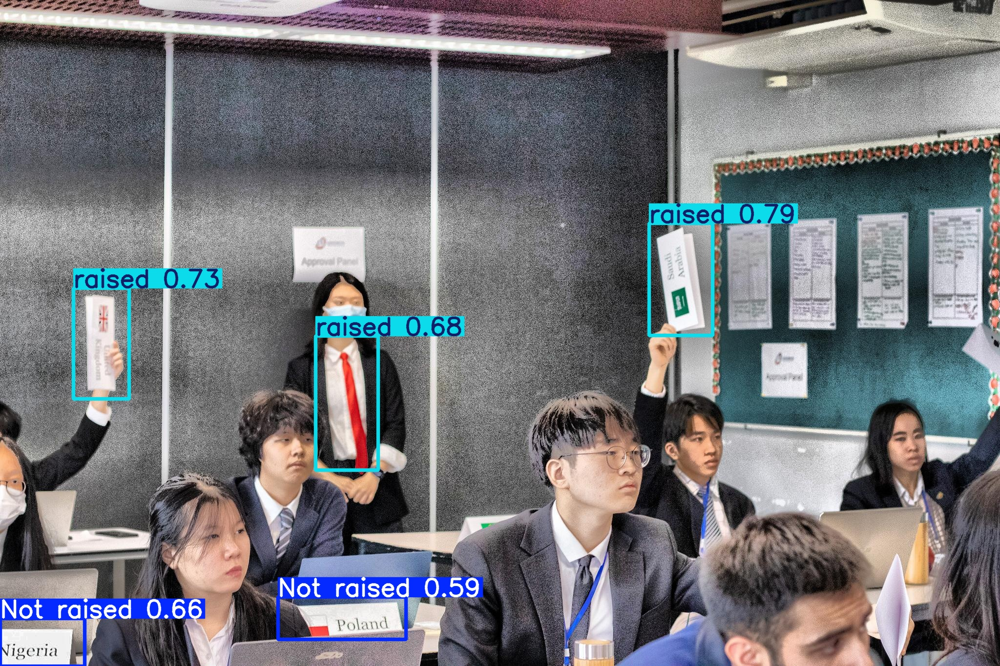

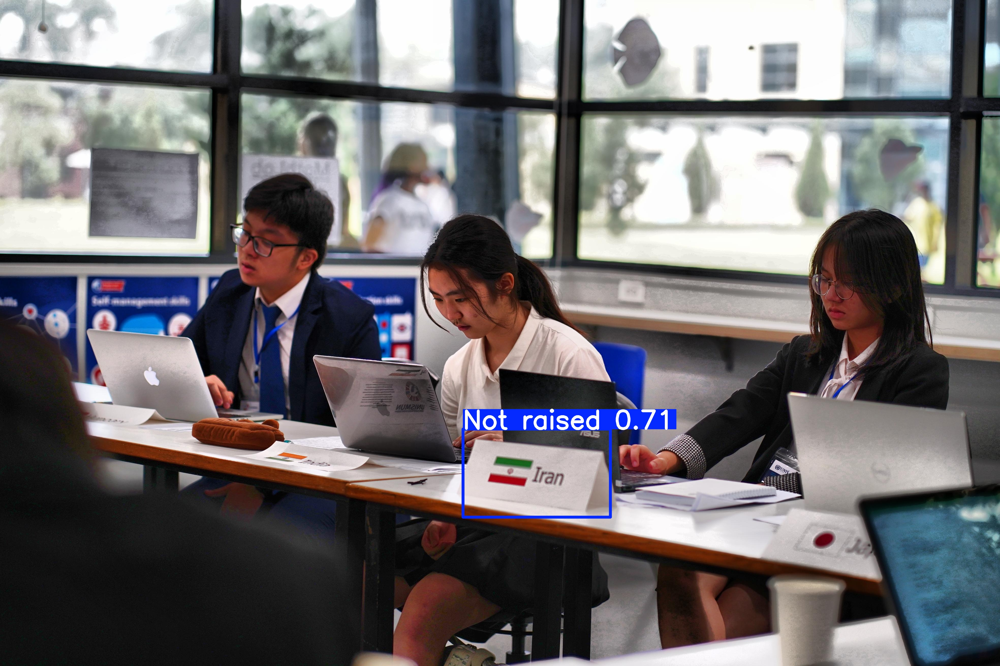

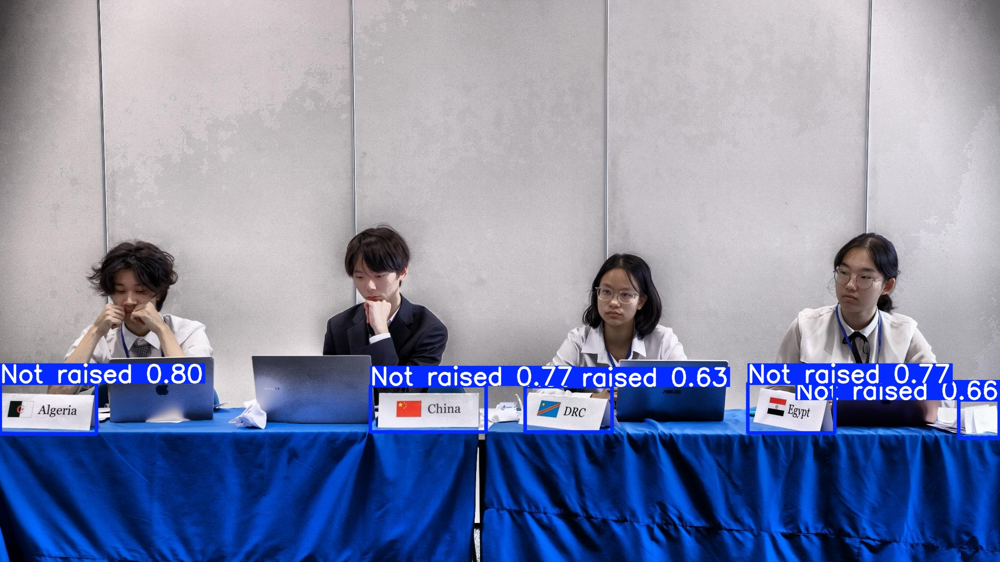

In [14]:
import glob
from IPython.display import display,Image

for image_path in glob.glob(f'/content/runs/detect/predict/*.jpg'):
  display(Image(filename=image_path,height=600))
  print("\n")